# Assignment 5 - Kaggle Competition and Unsupervised Learning {-}

## *Genesis Qu* {-}
Netid: ZQ46

Instructions for all assignments can be found [here](https://github.com/kylebradbury/ids705/blob/master/assignments/_Assignment%20Instructions.ipynb), and is also linked to from the [course syllabus](https://kylebradbury.github.io/ids705/index.html).

Total points in the assignment add up to 90; an additional 10 points are allocated to presentation quality.

# Learning objectives {-}
Through completing this assignment you will be able to...
1. Apply the full supervised machine learning pipeline of preprocessing, model selection, model performance evaluation and comparison, and model application to a real-world scale dataset
2. Apply clustering techniques to a variety of datasets with diverse distributional properties, gaining an understanding of their strengths and weaknesses and how to tune model parameters
3. Apply PCA and t-SNE for performing dimensionality reduction and data visualization

# 1 {-}

## [40 points] Kaggle Classification Competition {-}

You've learned a great deal about supervised learning and now it's time to bring together all that you've learned. You will be competing in a Kaggle Competition along with the rest of the class! Your goal is to predict hotel reservation cancellations based on a number of potentially related factors such as lead time on the booking, time of year, type of room, special requests made, number of children, etc. While you will be asked to take certain steps along the way to your submission, you're encouraged to try creative solutions to this problem and your choices are wide open for you to make your decisions on how to best make the predictions.

### IMPORTANT: Follow the link posted on Ed to register for the competition {-}
You can view the public leaderboard anytime [here](https://www.kaggle.com/c/ids705-a5-2023/leaderboard)

**The Data**. The dataset is provided as `a5_q1.pkl` which is a pickle file format, which allows you to load the data directly using the code below; the data can be downloaded from the [Kaggle competition website](https://www.kaggle.com/c/ids705-a5-2023/data). A data dictionary for the project can be found [here](https://github.com/rfordatascience/tidytuesday/blob/master/data/2020/2020-02-11/readme.md) and the original paper that describes the dataset can be found [here](https://www.sciencedirect.com/science/article/pii/S2352340918315191). When you load the data, 5 matrices are provided `X_train_original`, `y_train`, and `X_test_original`, which are the original, unprocessed features and labels for the training set and the test features (the test labels are not provided - that's what you're predicting). Additionally, `X_train_ohe` and `X_test_ohe` are provided which are one-hot-encoded (OHE) versions of the data. The OHE versions OHE processed every categorical variable. This is provided for convenience if you find it helpful, but you're welcome to reprocess the original data other ways if your prefer.

**Scoring**. You will need to achieve a minimum acceptable level of performance to demonstrate proficiency with using these supervised learning techniques. Beyond that, it's an open competition and scoring in the top three places of the *private leaderboard* will result in **5 bonus points in this assignment** (and the pride of the class!). Note: the Kaggle leaderboard has a public and private component. The public component is viewable throughout the competition, but the private leaderboard is revealed at the end. When you make a submission, you immediately see your submission on the public leaderboard, but that only represents scoring on a fraction of the total collection of test data, the rest remains hidden until the end of the competition to prevent overfitting to the test data through repeated submissions. You will be be allowed to hand-select two eligible submissions for private score, or by default your best two public scoring submissions will be selected for private scoring.


### Requirements: {-}

**(a) Explore your data.** Review and understand your data. Look at it; read up on what the features represent; think through the application domain; visualize statistics from the paper data to understand any key relationships. **There is no output required for this question**, but you are encouraged to explore the data personally before going further.

**(b) Preprocess your data.** Preprocess your data so it's ready for use for classification and describe what you did and why you did it. Preprocessing may include: normalizing data, handling missing or erroneous values, separating out a validation dataset, preparing categorical variables through one-hot-encoding, etc. To make one step in this process easier, you're provided with a one-hot-encoded version of the data already. 
- Comment on each type of preprocessing that you apply and both how and why you apply it.

**(c) Select, train, and compare models.** Fit at least 5 models to the data. Some of these can be experiments with different hyperparameter-tuned versions of the same model, although all 5 should not be the same type of model. There are no constraints on the types of models, but you're encouraged to explore examples we've discussed in class including:

1. Logistic regression
2. K-nearest neighbors
3. Random Forests
4. Neural networks
5. Support Vector Machines
6. Ensembles of models (e.g. model bagging, boosting, or stacking). `Scikit-learn` offers a number of tools for assisting with this including those for [bagging](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.BaggingClassifier.html#sklearn.ensemble.BaggingClassifier), [boosting](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html), and [stacking](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.StackingClassifier.html). You're also welcome to explore options beyond the `sklean` universe; for example, some of you may have heard of [XGBoost](https://github.com/dmlc/xgboost) which is a very fast implementation of gradient boosted decision trees that also allows for parallelization. 

When selecting models, be aware that some models may take far longer than others to train. Monitor your output and plan your time accordingly. 

Assess the classification performance AND computational efficiency of the models you selected:
- Plot the ROC curves and PR curves for your models in two plots: one of ROC curves and one of PR curves. For each of these two plots, compare the performance of the models you selected above and trained on the training data, evaluating them on the validation data. Be sure to plot the line representing random guessing on each plot. You should plot all of the model's ROC curves on a single plot and the PR curves on a single plot. One of the models should also be your BEST performing submission on the Kaggle public leaderboard (see below). In the legends of each, include the area under the curve for each model (limit to 3 significant figures). For the ROC curve, this is the AUC; for the PR curve, this is the average precision (AP).
- As you train and validate each model time how long it takes to train and validate in each case and create a plot that shows both the training and prediction time for each model included in the ROC and PR curves.
- Describe: 
  - Your process of model selection and hyperparameter tuning
  - Which model performed best and your process for identifying/selecting it

**(d) Apply your model "in practice".** Make *at least* 5 submissions of different model results to the competition (more submissions are encouraged and you can submit up to 5 per day!). These do not need to be the same that you report on above, but you should select your *most competitive* models.
- Produce submissions by applying your model on the test data.
- Be sure to RETRAIN YOUR MODEL ON ALL LABELED TRAINING AND VALIDATION DATA before making your predictions on the test data for submission. This will help to maximize your performance on the test data.
- In order to get full credit on this problem you must achieve an AUC on the Kaggle public leaderboard above the "Benchmark" score on the public leaderboard.

### Guidance: {-}
1. **Preprocessing**. You may need to preprocess the data for some of these models to perform well (scaling inputs or reducing dimensionality). Some of this preprocessing may differ from model to model to achieve the best performance. A helpful tool for creating such preprocessing and model fitting pipelines is the sklearn `pipeline` module which lets you group a series of processing steps together.
2. **Hyperparameters**. Hyperparameters may need to be tuned for some of the model you use. You may want to perform hyperparameter tuning for some of the models. If you experiment with different hyperparameters that include many model runs, you may want to apply them to a small subsample of your overall data before running it on the larger training set to be time efficient (if you do, just make sure to ensure your selected subset is representative of the rest of your data).
3. **Validation data**. You're encouraged to create your own validation dataset for comparing model performance; without this, there's a significant likelihood of overfitting to the data. A common choice of the split is 80% training, 20% validation. Before you make your final predictions on the test data, be sure to retrain your model on the entire dataset.
4. **Training time**. This is a larger dataset than you've worked with previously in this class, so training times may be higher that what you've experienced in the past. Plan ahead and get your model pipeline working early so you can experiment with the models you use for this problem and have time to let them run. 

### Starter code {-}
Below is some code for (1) loading the data and (2) once you have predictions in the form of confidence scores for those classifiers, to produce submission files for Kaggle.

In [1]:
import pandas as pd
import numpy as np
import pickle

################################
# Load the data
################################
data = pickle.load(open("./data/a5_q1.pkl", "rb"))

y_train = data["y_train"]
X_train_original = data["X_train"]  # Original dataset
X_train_ohe = data["X_train_ohe"]  # One-hot-encoded dataset

X_test_original = data["X_test"]
X_test_ohe = data["X_test_ohe"]

################################
# Produce submission
################################


def create_submission(confidence_scores, save_path):
    """Creates an output file of submissions for Kaggle

    Parameters
    ----------
    confidence_scores : list or numpy array
        Confidence scores (from predict_proba methods from classifiers) or
        binary predictions (only recommended in cases when predict_proba is
        not available)
    save_path : string
        File path for where to save the submission file.

    Example:
    create_submission(my_confidence_scores, './data/submission.csv')

    """
    import pandas as pd

    submission = pd.DataFrame({"score": confidence_scores})
    submission.to_csv(save_path, index_label="id")


In [2]:
# Set plot configurations
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

import seaborn as sns
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
sns.set_context('notebook')
sns.set_style("ticks")

**ANSWER**

### **Data Exploration** {-}

**Checking shape of data**

In [5]:
print(X_train_original.shape)
print(y_train.shape)
print(X_test_original.shape)


(95512, 29)
(95512,)
(23878, 29)


> The dataset contains 95512 training observations with 29 features. The test set we will make predictions on has 23878 observations.

**Check columns**

In [7]:
X_train_original.columns


Index(['hotel', 'lead_time', 'arrival_date_year', 'arrival_date_month',
       'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'meal', 'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests'],
      dtype='object')

In [9]:
y_train.name


'is_canceled'

> Examining the columns of the data, we find that each observation is one hotel reservation, with information about the hotel, the time the reservations was made, information about the customer and about the specific reservation that was made. The response variable is a indicator variable of whether the reservation was cancelled.

**Check missing values**

In [11]:
X_train_original.isna().sum()


hotel                                 0
lead_time                             0
arrival_date_year                     0
arrival_date_month                    0
arrival_date_week_number              0
arrival_date_day_of_month             0
stays_in_weekend_nights               0
stays_in_week_nights                  0
adults                                0
children                              2
babies                                0
meal                                  0
country                             395
market_segment                        0
distribution_channel                  0
is_repeated_guest                     0
previous_cancellations                0
previous_bookings_not_canceled        0
reserved_room_type                    0
assigned_room_type                    0
booking_changes                       0
deposit_type                          0
agent                             13081
company                           90059
days_in_waiting_list                  0


In [12]:
X_test_original.isna().sum()


hotel                                 0
lead_time                             0
arrival_date_year                     0
arrival_date_month                    0
arrival_date_week_number              0
arrival_date_day_of_month             0
stays_in_weekend_nights               0
stays_in_week_nights                  0
adults                                0
children                              2
babies                                0
meal                                  0
country                              93
market_segment                        0
distribution_channel                  0
is_repeated_guest                     0
previous_cancellations                0
previous_bookings_not_canceled        0
reserved_room_type                    0
assigned_room_type                    0
booking_changes                       0
deposit_type                          0
agent                              3259
company                           22534
days_in_waiting_list                  0


> For both the training and test X data, there are missing values in the children, country, agent, and company columns.

**EDA**

In [26]:
city_cancel = y_train[X_train_original["hotel"] == "City Hotel"].mean()
resort_cancel = y_train[X_train_original["hotel"] == "Resort Hotel"].mean()


In [88]:
# hotel by cancellation
print(f"Of all of City Hotel reservations, {city_cancel * 100:.2f}% were cancelled.")
print(
    f"Of all of Resorts Hotel reservations, {resort_cancel * 100:.2f}% were cancelled."
)
print(f"Overall, {y_train.mean()*100:.2f}% of reservations were cancelled.")


Of all of City Hotel reservations, 41.69% were cancelled.
Of all of Resorts Hotel reservations, 27.88% were cancelled.
Overall, 37.05% of reservations were cancelled.


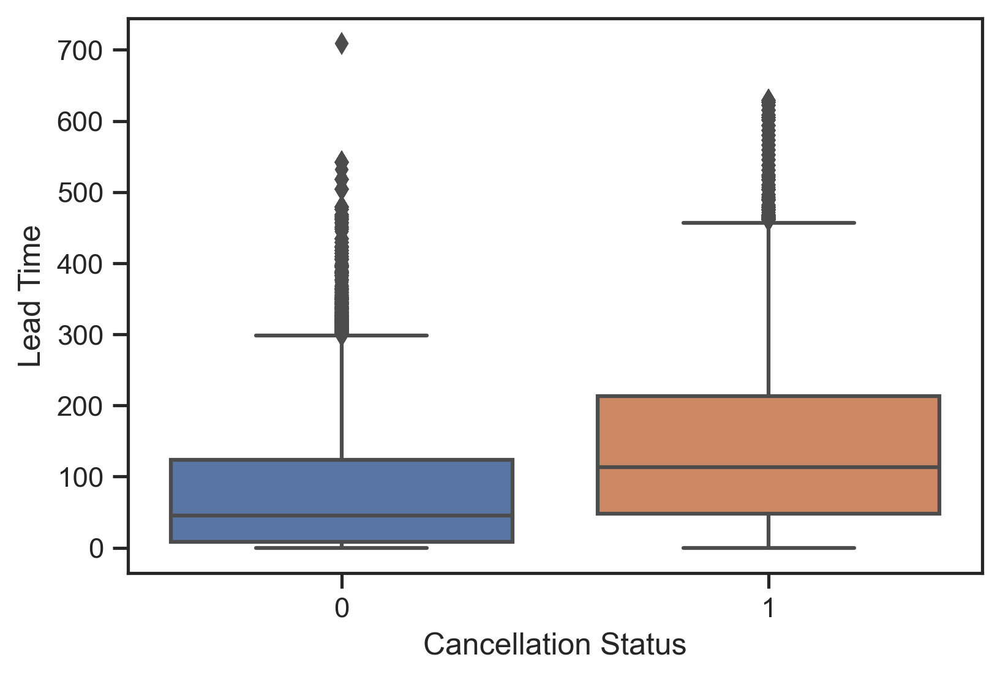

In [170]:
# Visualize the relationship between lead time and cancellation
sns.boxplot(x=y_train, y=X_train_original["lead_time"])
plt.xlabel("Cancellation Status")
plt.ylabel("Lead Time")
plt.show()


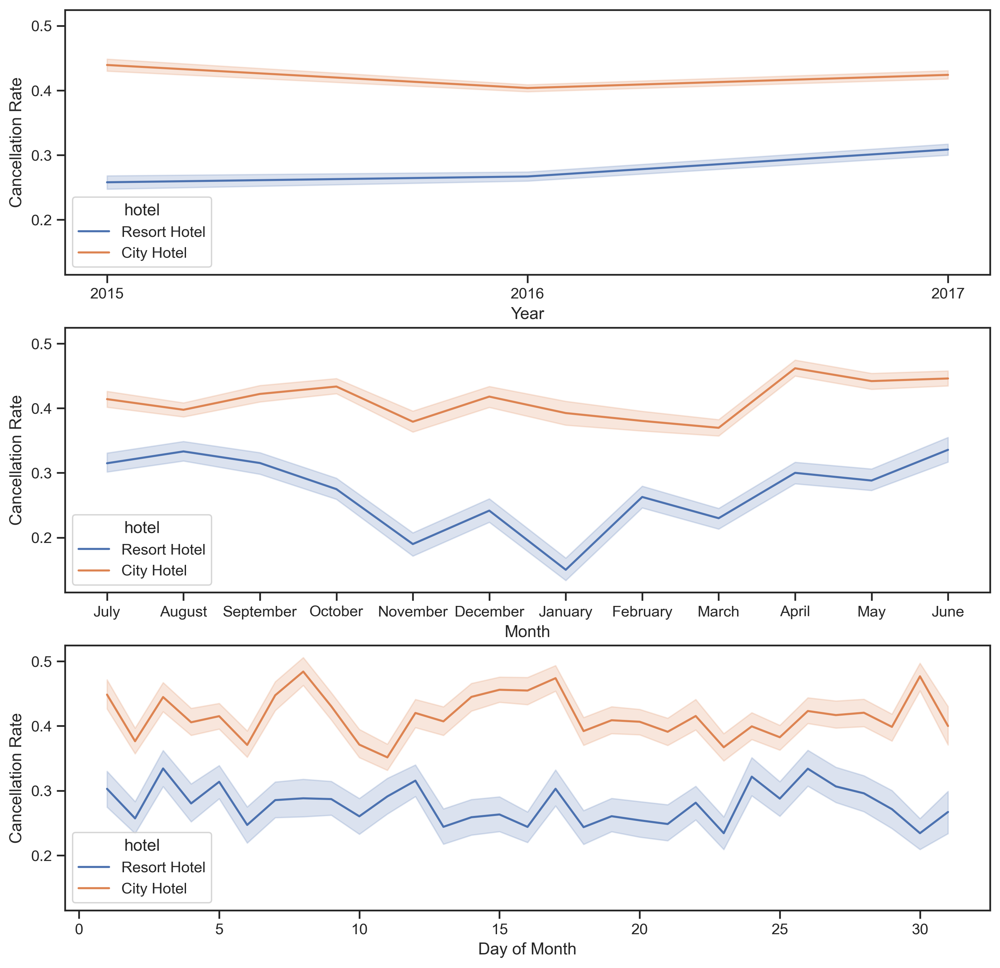

In [62]:
fig, axes = plt.subplots(3, figsize=(12, 12), sharey=True)
# Plot year data
sns.lineplot(
    x=X_train_original["arrival_date_year"],
    y=y_train,
    hue=X_train_original["hotel"],
    ax=axes[0],
)
axes[0].set_ylabel("Cancellation Rate")
axes[0].set_xlabel("Year")
axes[0].set_xticks([2015, 2016, 2017], ["2015", "2016", "2017"])
# Plot month data
sns.lineplot(
    x=X_train_original["arrival_date_month"],
    y=y_train,
    hue=X_train_original["hotel"],
    ax=axes[1],
)
axes[1].set_ylabel("Cancellation Rate")
axes[1].set_xlabel("Month")
# Plot date data
sns.lineplot(
    x=X_train_original["arrival_date_day_of_month"],
    y=y_train,
    hue=X_train_original["hotel"],
    ax=axes[2],
)
axes[2].set_ylabel("Cancellation Rate")
axes[2].set_xlabel("Day of Month")
plt.show()


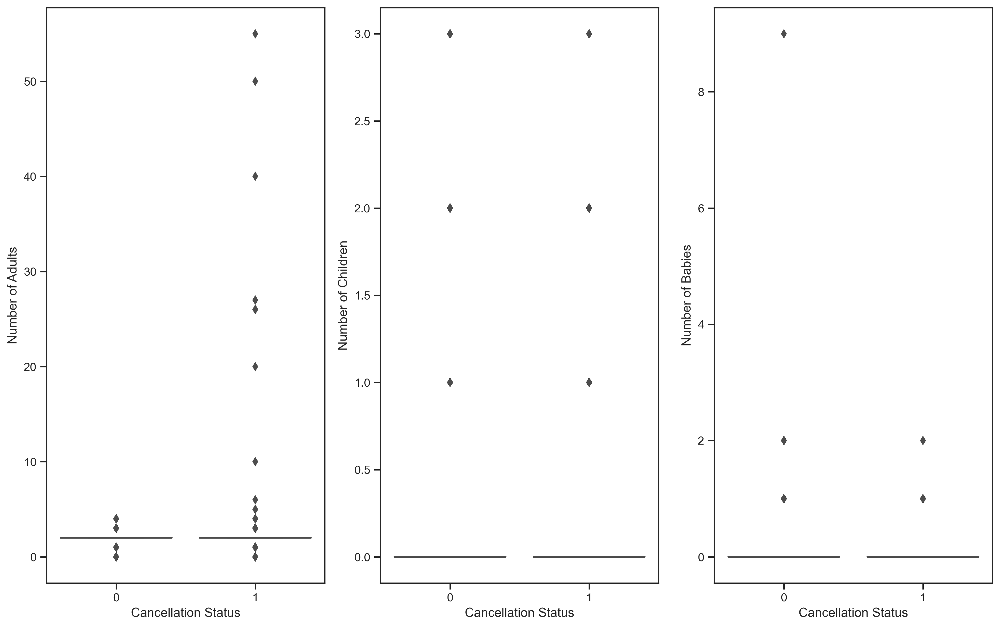

In [90]:
fig, axes = plt.subplots(1, 3, figsize=(16, 10))
# plot cancellation status boxplots by adults
sns.boxplot(x=y_train, y=X_train_original["adults"], ax=axes[0])
axes[0].set_xlabel("Cancellation Status")
axes[0].set_ylabel("Number of Adults")
# plot cancellation status boxplots by children
sns.boxplot(x=y_train, y=X_train_original["children"], ax=axes[1])
axes[1].set_xlabel("Cancellation Status")
axes[1].set_ylabel("Number of Children")
# plot cancellation status boxplots by babies
sns.boxplot(x=y_train, y=X_train_original["babies"], ax=axes[2])
axes[2].set_xlabel("Cancellation Status")
axes[2].set_ylabel("Number of Babies")

plt.show()


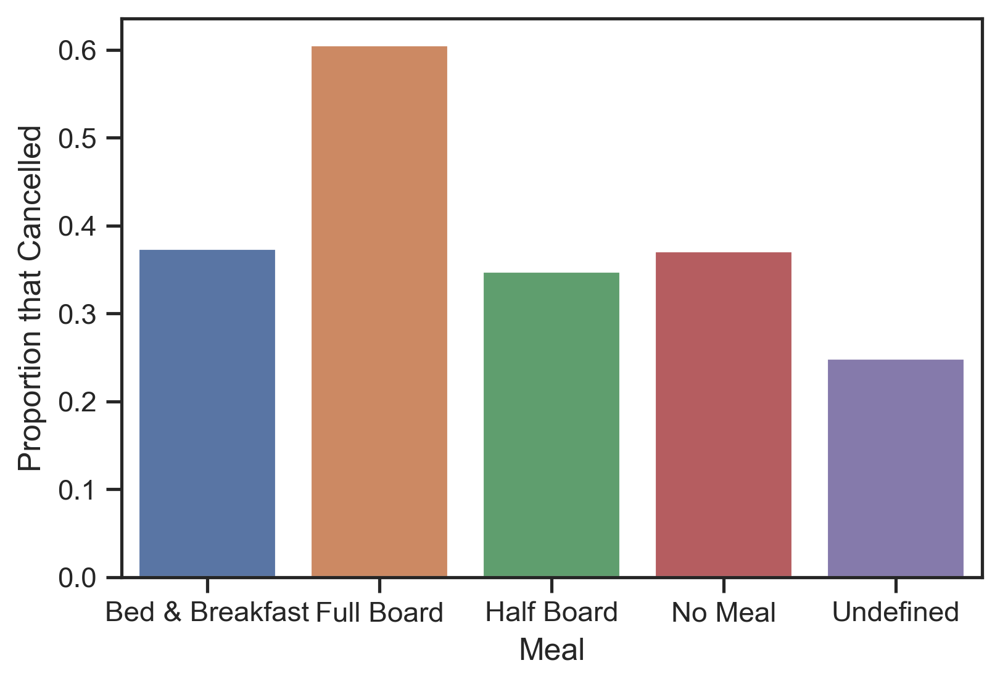

In [98]:
# Visualize meal status by cancellation
meal_cancellation_probs = y_train.groupby(X_train_original["meal"]).mean()
ax = sns.barplot(x=meal_cancellation_probs.index, y=meal_cancellation_probs.values)
ax.set_xticks(
    range(5), ["Bed & Breakfast", "Full Board", "Half Board", "No Meal", "Undefined"]
)
ax.set_xlabel("Meal")
ax.set_ylabel("Proportion that Cancelled")
plt.show()


['Direct' 'Corporate' 'Online TA' 'Offline TA/TO' 'Groups' 'Complementary'
 'Undefined' 'Aviation']


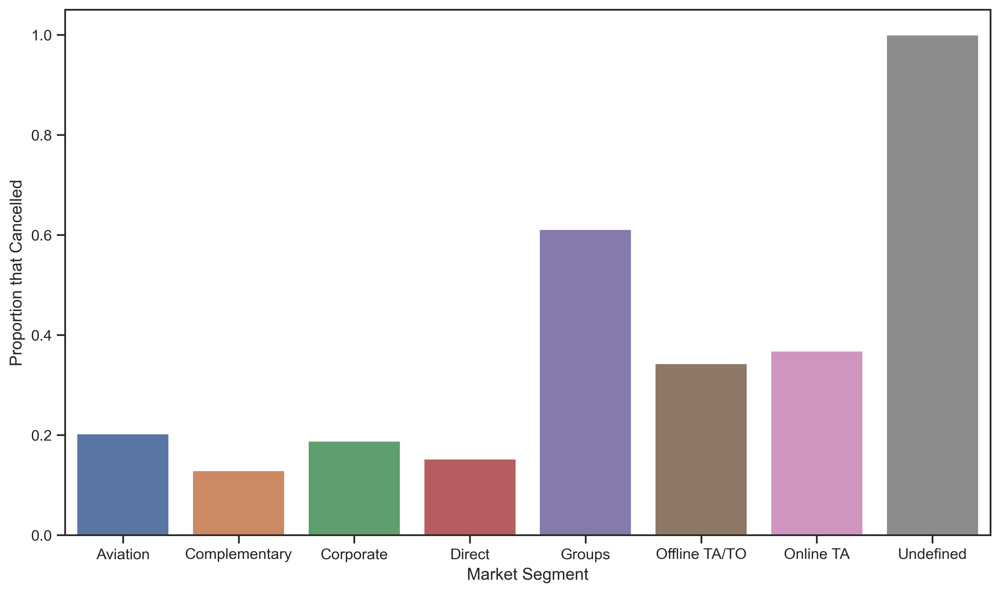

In [109]:
# Visualize meal status by market segment
segment_cancellation_probs = y_train.groupby(X_train_original["market_segment"]).mean()
fig, ax = plt.subplots(figsize=(12, 7))
sns.barplot(
    x=segment_cancellation_probs.index, y=segment_cancellation_probs.values, ax=ax
)
ax.set_xlabel("Market Segment")
ax.set_ylabel("Proportion that Cancelled")
plt.show()


['Direct' 'Corporate' 'TA/TO' 'Undefined' 'GDS']


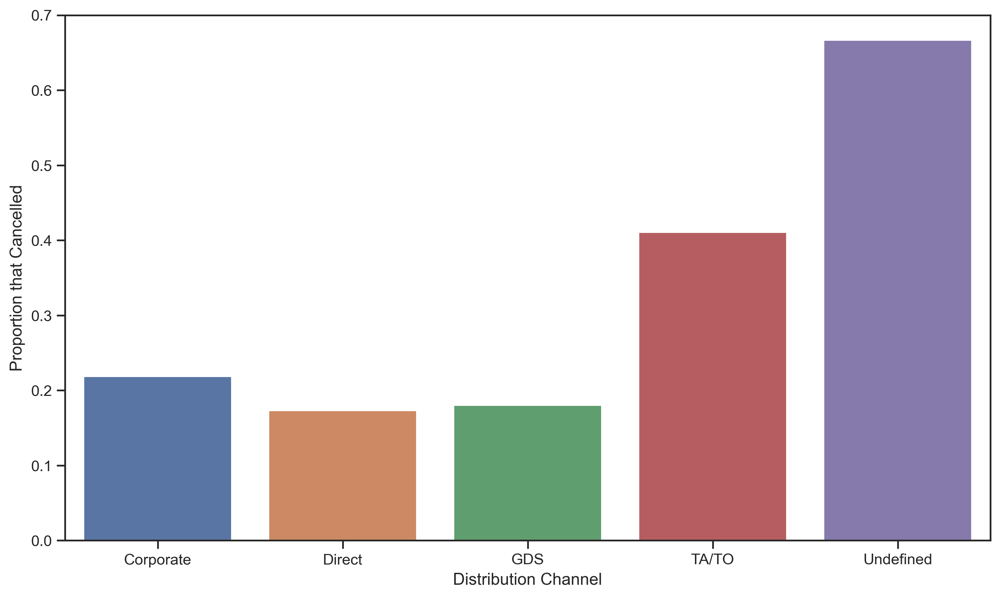

In [111]:
# Visualize distribution channnels by market segment
channel_cancellation_probs = y_train.groupby(
    X_train_original["distribution_channel"]
).mean()
fig, ax = plt.subplots(figsize=(12, 7))
sns.barplot(
    x=channel_cancellation_probs.index, y=channel_cancellation_probs.values, ax=ax
)
ax.set_xlabel("Distribution Channel")
ax.set_ylabel("Proportion that Cancelled")
plt.show()


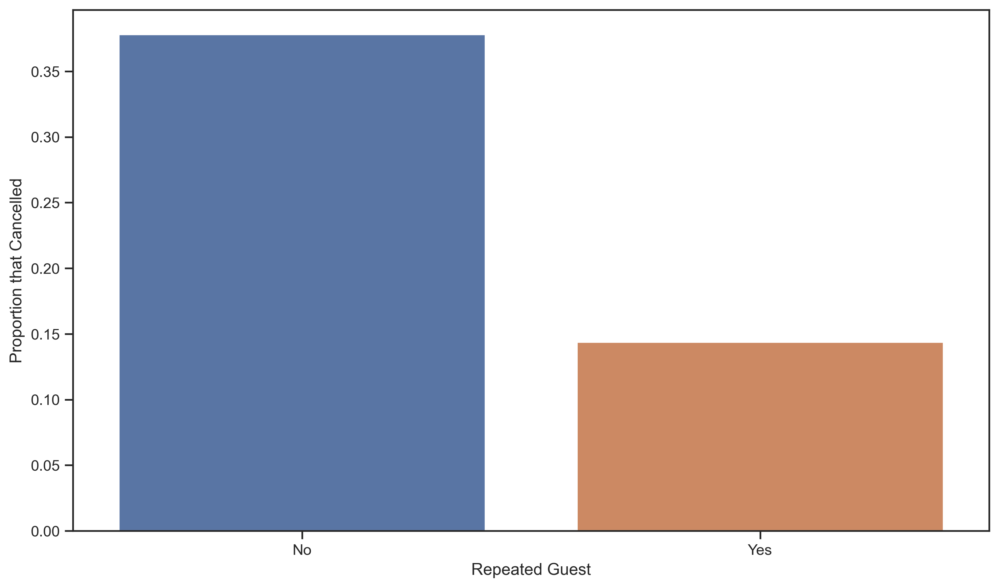

In [113]:
# Visualize distribution channnels by whether someone is a repeated guest
channel_cancellation_probs = y_train.groupby(
    X_train_original["is_repeated_guest"]
).mean()
fig, ax = plt.subplots(figsize=(12, 7))
sns.barplot(
    x=channel_cancellation_probs.index, y=channel_cancellation_probs.values, ax=ax
)
ax.set_xticklabels(["No", "Yes"])
ax.set_xlabel("Repeated Guest")
ax.set_ylabel("Proportion that Cancelled")
plt.show()


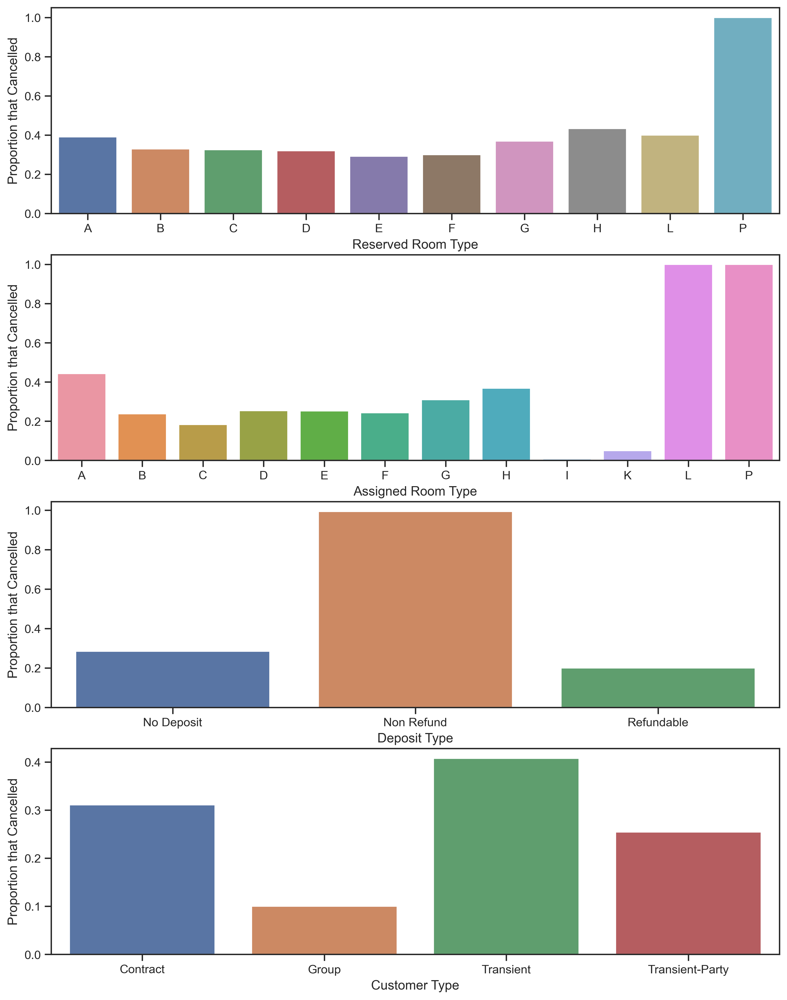

In [156]:
# Visualize distribution channnels by reserved room type
fig, axes = plt.subplots(4, figsize=(12, 16))
tmp_table = y_train.groupby(X_train_original["reserved_room_type"]).mean()
sns.barplot(x=tmp_table.index, y=tmp_table.values, ax=axes[0])
axes[0].set_xlabel("Reserved Room Type")
axes[0].set_ylabel("Proportion that Cancelled")
tmp_table = y_train.groupby(X_train_original["assigned_room_type"]).mean()
sns.barplot(x=tmp_table.index, y=tmp_table.values, ax=axes[1])
axes[1].set_xlabel("Assigned Room Type")
axes[1].set_ylabel("Proportion that Cancelled")
tmp_table = y_train.groupby(X_train_original["deposit_type"]).mean()
sns.barplot(x=tmp_table.index, y=tmp_table.values, ax=axes[2])
axes[2].set_xlabel("Deposit Type")
axes[2].set_ylabel("Proportion that Cancelled")
tmp_table = y_train.groupby(X_train_original["customer_type"]).mean()
sns.barplot(x=tmp_table.index, y=tmp_table.values, ax=axes[3])
axes[3].set_xlabel("Customer Type")
axes[3].set_ylabel("Proportion that Cancelled")
plt.show()
plt.show()


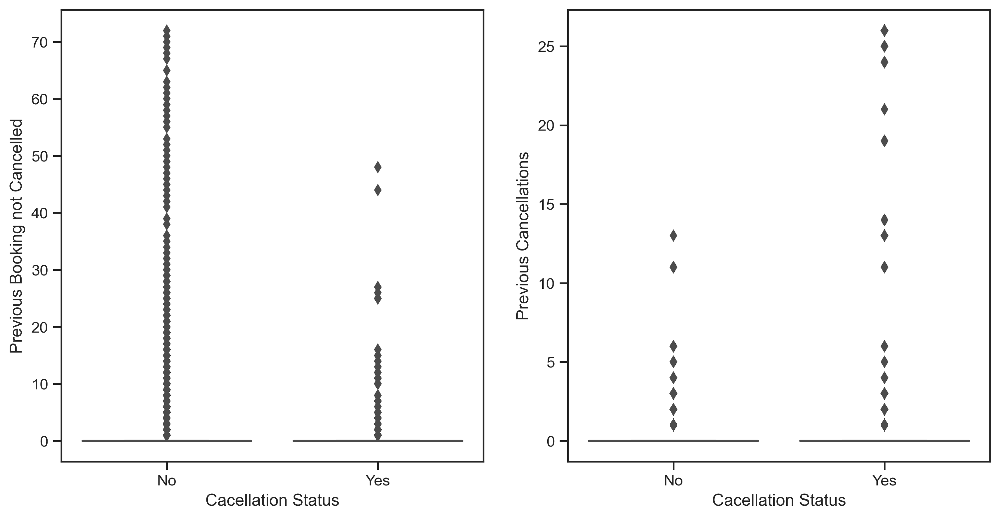

In [129]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
# Boxplot of previous bookings not cancelled
sns.boxplot(x=y_train, y=X_train_original["previous_bookings_not_canceled"], ax=axes[0])
axes[0].set_xticklabels(["No", "Yes"])
axes[0].set_ylabel("Previous Booking not Cancelled")
axes[0].set_xlabel("Cacellation Status")
# Boxplot of previous bookings cancelled
sns.boxplot(x=y_train, y=X_train_original["previous_cancellations"], ax=axes[1])
axes[1].set_xticklabels(["No", "Yes"])
axes[1].set_ylabel("Previous Cancellations")
axes[1].set_xlabel("Cacellation Status")
plt.show()


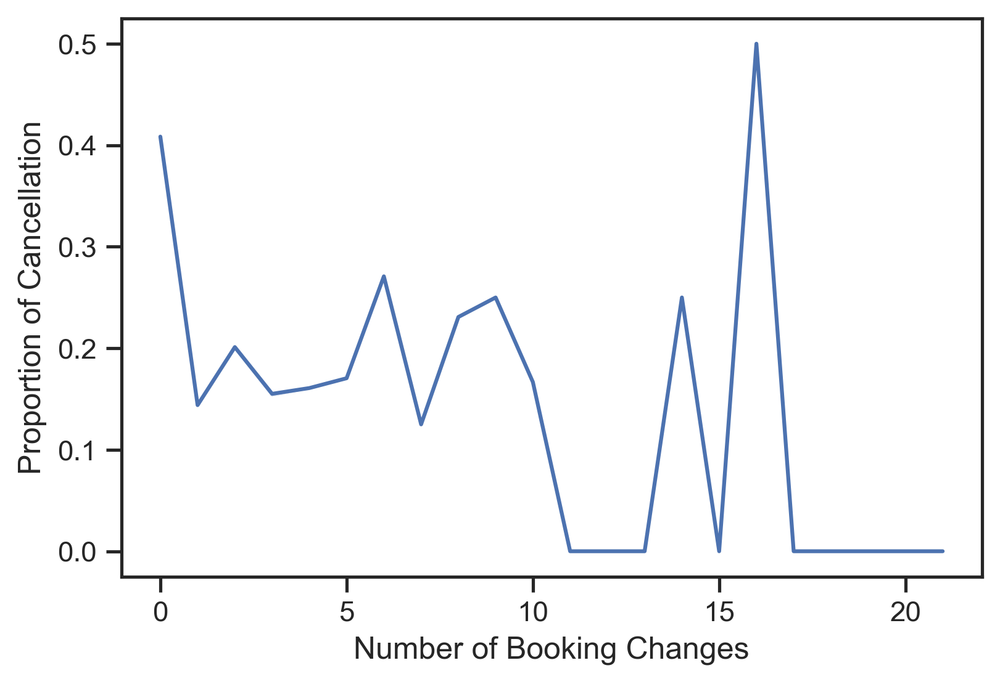

In [167]:
# Lineplot of number of booking changes by proportion of cancellation
ax = sns.lineplot(y=y_train, x=X_train_original["booking_changes"], errorbar=["ci", 0])
ax.set_ylabel("Proportion of Cancellation")
ax.set_xlabel("Number of Booking Changes")
plt.show()


### **Preprocessing** {-}


> Having done exploratory data analysis and looked at the structure of the variables in our data, below is a list of changes we are making to the data and the considerations that lead to these decisions. 
> 
> - We decided to use the One-Hot-Encoded version of the dataset since there are no missing values in the categorical variables (the NA values are in-practice encoded as a separate category)
> - We built a pipeline for the pre-processing steps to expedite the pre-processing steps and make it easy to apply the steps on test data.
> - We split our OHE training dataset further into a training, a validation and a test dataset. We train our respective models on the training set, tuning our hyperparameters on the validation set, and evaluate their generalization performance on the test set. In essense, we split our original training data into two sets, and split the first dataset further into two sets.
> - On our numeric columns, which happens to be the first 17 columns in the OHE dataset, we apply a Standard Scaler to demean the variables and divide them by their standard deviation. This ensures better performance on non-parametric machine learning methods that we use below, such as SVM, Tree-based models, and MLP classsifier. 
> - We also apply a feature selection method through scikit-learn's `SelectKBest` method, with K being a tunable hyperparameter, which uses ANOVA F-values to select K best features for classifying our independent variable. This allows us to avoid the model overfitting to variables that do not matter. 
> - 

In [221]:
# Load in required modules

from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import (
    train_test_split,
    RandomizedSearchCV,
    PredefinedSplit,
)
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest, VarianceThreshold
from scipy.stats import loguniform, uniform


#### Split training data into train-val-test datasets {-}

> Below, we define a function that first splits the larger X dataset into a "training" and test set, and the split our "training" set into a training and a validation set.
>
> Then, we apply this function to our One-Hot-Encoding dataset to get our train-validation-test sets, using the indices of our training and validation set, we can define a split used in our hyperparameter tuning.

In [4]:
# Function that splits training data into train-val_test
def train_val_test_split(X, y):
    """Split the larger X dataset into a training set,
    a validation set, and a test set, stratified based on
    the presence of the target variable. Returns the three
    datasets as well as the inidces for the training and
    validation sets."""
    (
        X_train_train_plus_val,
        X_train_test,
        y_train_train_plus_val,
        y_train_test,
    ) = train_test_split(X, y, test_size=0.2, random_state=4, stratify=y_train)

    # Split training data further into train and validation data
    indices = np.arange(X_train_train_plus_val.shape[0])
    (
        X_train_train,
        X_train_val,
        y_train_train,
        y_train_val,
        indices_train,
        indices_val,
    ) = train_test_split(
        X_train_train_plus_val,
        y_train_train_plus_val,
        indices,
        test_size=0.3,
        random_state=4,
        stratify=y_train_train_plus_val,
    )
    return (
        X_train_train,
        X_train_val,
        X_train_train_plus_val,
        X_train_test,
        y_train_train,
        y_train_val,
        y_train_train_plus_val,
        y_train_test,
        indices_train,
        indices_val,
    )


# Define split for the ohe dataset
(
    X_train_train_ohe,
    X_train_val_ohe,
    X_train_train_plus_val_ohe,
    X_train_test_ohe,
    y_train_train_ohe,
    y_train_val_ohe,
    y_train_train_plus_val_ohe,
    y_train_test_ohe,
    indices_train_ohe,
    indices_val_ohe,
) = train_val_test_split(X_train_ohe, y_train)

# Create a predefined train/test split for RandomSearchCV (to be used later)
validation_fold = np.zeros((y_train_train_plus_val_ohe.shape))
validation_fold[indices_train_ohe] = -1
train_val_split = PredefinedSplit(validation_fold)


#### Create pipeline {-}

> In the pipeline, we apply the preprocessing steps we mentioned earlier, passing through the categorical variables, and define a classifier that we'll use on the data.

In [7]:
# Preprocessing for OHE data
def create_pipeline_ohe(classifier, num_ind):
    """Create a pipeline that transforms
    numeric columns, selects K best features, and
    defines a classifier"""
    # Create numeric transformer
    numeric_transformer = Pipeline(
        steps=[("scaler", StandardScaler()), ("impute", SimpleImputer())]
    )

    # Appending numeric and categorical transformers together
    preprocessor = ColumnTransformer(
        transformers=[
            ("num", numeric_transformer, num_ind),
        ],
        remainder="passthrough",
    )

    pipeline = Pipeline(
        steps=[
            ("preprocessor", preprocessor),
            ("reduce", VarianceThreshold(threshold=0)),
            ("select", SelectKBest(k=30)),
            ("classifier", classifier),
        ]
    )

    return pipeline


#### Logistic Regression with L2 Penalty {-}

> Below, we define a logistic regression with L2 penalty to avoid overfitting, and use randomized search cross-validation to search for an optimal hyperparameter value for the regularization parameter C.

In [222]:
# Define Logistic Regerssion Pipeline
logistic_ohe = create_pipeline_ohe(
    LogisticRegression(penalty="l2", solver="liblinear"), num_ind=list(range(17))
)
logistic_ohe

# Randomized Search CV to hyperparameter search
param_grid = {
    "classifier__C": np.logspace(-3, 2, 10),
    "select__k": [25, 35, 40, 60, 100],
}

# Define Randomized Search Instance
logistic_ohe_search = RandomizedSearchCV(
    logistic_ohe, param_grid, random_state=4, cv=train_val_split, scoring="roc_auc"
)

# Fit the randomized search instance on training data
logistic_ohe_search.fit(X_train_train_plus_val_ohe, y_train_train_plus_val_ohe)


RandomizedSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ..., -1, -1])),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num',
                                                                               Pipeline(steps=[('scaler',
                                                                                                StandardScaler()),
                                                                                               ('impute',
                                                                                                SimpleImputer())]),
                                                                               [0,
                                                                                1,
                                                                                2,
                                                                                3,
                                                                                4,
                                                                                5,
                                                                                6,
                                                                                7,
                                                                                8,
                                                                                9,
                                                                                10,
                                                                                11,
                                                                                12,
                                                                                13,
                                                                                14,
                                                                                15,
                                                                                16])])),
                                             ('reduce',
                                              VarianceThreshold(threshold=0)),
                                             ('select', SelectKBest(k=30)),
                                             ('classifier',
                                              LogisticRegression(solver='liblinear'))]),
                   param_distributions={'classifier__C': array([1.00000000e-03, 3.59381366e-03, 1.29154967e-02, 4.64158883e-02,
       1.66810054e-01, 5.99484250e-01, 2.15443469e+00, 7.74263683e+00,
       2.78255940e+01, 1.00000000e+02]),
                                        'select__k': [25, 35, 40, 60, 100]},
                   random_state=4, scoring='roc_auc')

In [223]:
print(
    "The logistic classifier had an AUC score of "
    f"{logistic_ohe_search.score(X_train_test_ohe, y_train_test_ohe):.2f}"
    " on test data."
)


The logistic classifier had an AUC score of 0.89 on test data.


#### Support Vector Machine {-}

> Here, we define a Support Vector Machine model with Radial Basis Kernel, and use randomized search cross-validation to search for an optimal hyperparameter value for the regularization parameter C.

In [264]:
# Support Vector Machine
from sklearn.svm import SVC

# Create SVM pipeline
svm = create_pipeline_ohe(
    classifier=SVC(kernel="rbf", gamma="auto", probability=True), num_ind=list(range(17))
)

# Randomized Search CV to hyperparameter search
param_grid = {
    "classifier__C": loguniform(1e-3, 1),
    "select__k": [25, 35, 40, 60, 100],
}

# Define Randomized Search Instance
svm_search = RandomizedSearchCV(
    svm, param_grid, random_state=4, cv=train_val_split, scoring="roc_auc", n_jobs=-1
)

# Fit Randomized Search Instance on Training data
svm_search.fit(X_train_train_plus_val_ohe, y_train_train_plus_val_ohe)


RandomizedSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ..., -1, -1])),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num',
                                                                               Pipeline(steps=[('scaler',
                                                                                                StandardScaler()),
                                                                                               ('impute',
                                                                                                SimpleImputer())]),
                                                                               [0,
                                                                                1,
                                                                                2,
                                                                                3,
                                                                                4,
                                                                                5,
                                                                                6,
                                                                                7,
                                                                                8,
                                                                                9,
                                                                                10,
                                                                                11,
                                                                                12,
                                                                                13,
                                                                                14,
                                                                                15,
                                                                                16])])),
                                             ('reduce',
                                              VarianceThreshold(threshold=0)),
                                             ('select', SelectKBest(k=30)),
                                             ('classifier',
                                              SVC(gamma='auto',
                                                  probability=True))]),
                   n_jobs=-1,
                   param_distributions={'classifier__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x51299a110>,
                                        'select__k': [25, 35, 40, 60, 100]},
                   random_state=4, scoring='roc_auc')

In [265]:
print(
    "The SVM classifier had an AUC score of "
    f"{svm_search.score(X_train_test_ohe, y_train_test_ohe):.2f}"
    " on test data."
)


The SVM classifier had an AUC score of 0.89 on test data.


#### Random Forest {-}

> Here, we define a Random Forest model , and use randomized search cross-validation to search for optimal hyperparameter values for features inputted, the number of trees and the maximum depth for each tree.

In [224]:
from sklearn.ensemble import RandomForestClassifier

# Define random forest pipeline
random_forest = create_pipeline_ohe(
    classifier=RandomForestClassifier(n_jobs=-1), num_ind=list(range(17))
)

# Define parameter grid for hyperparameter tuning
param_grid = {
    "classifier__n_estimators": [100, 500, 1000, 1500],
    "classifier__max_depth": [None, 5, 10],
    "select__k": [25, 35, 40, 60, 100],
}

# Define randomized search instance
random_forest_search = RandomizedSearchCV(
    random_forest,
    param_grid,
    random_state=4,
    cv=train_val_split,
    scoring="roc_auc",
    n_jobs=-1,
    verbose=2,
)

# Fit the randomized search on training data
random_forest_search.fit(X_train_train_plus_val_ohe, y_train_train_plus_val_ohe)


Fitting 1 folds for each of 10 candidates, totalling 10 fits
[CV] END classifier__max_depth=5, classifier__n_estimators=100, select__k=25; total time=  11.3s
[CV] END classifier__max_depth=5, classifier__n_estimators=100, select__k=100; total time=  11.7s
[CV] END classifier__max_depth=None, classifier__n_estimators=100, select__k=100; total time=  15.7s
[CV] END classifier__max_depth=5, classifier__n_estimators=500, select__k=60; total time=  19.1s
[CV] END classifier__max_depth=10, classifier__n_estimators=100, select__k=60; total time=  11.6s
[CV] END classifier__max_depth=5, classifier__n_estimators=1000, select__k=40; total time=  26.0s
[CV] END classifier__max_depth=5, classifier__n_estimators=1500, select__k=25; total time=  31.4s
[CV] END classifier__max_depth=None, classifier__n_estimators=500, select__k=35; total time=  21.6s
[CV] END classifier__max_depth=10, classifier__n_estimators=1500, select__k=35; total time=  34.9s
[CV] END classifier__max_depth=None, classifier__n_es

RandomizedSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ..., -1, -1])),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num',
                                                                               Pipeline(steps=[('scaler',
                                                                                                StandardScaler()),
                                                                                               ('impute',
                                                                                                SimpleImputer())]),
                                                                               [0,
                                                                                1,
                                                                                2,
                                                                                3,
                                                                                4,
                                                                                5,
                                                                                6,
                                                                                7,
                                                                                8,
                                                                                9,
                                                                                10,
                                                                                11,
                                                                                12,
                                                                                13,
                                                                                14,
                                                                                15,
                                                                                16])])),
                                             ('reduce',
                                              VarianceThreshold(threshold=0)),
                                             ('select', SelectKBest(k=30)),
                                             ('classifier',
                                              RandomForestClassifier(n_jobs=-1))]),
                   n_jobs=-1,
                   param_distributions={'classifier__max_depth': [None, 5, 10],
                                        'classifier__n_estimators': [100, 500,
                                                                     1000,
                                                                     1500],
                                        'select__k': [25, 35, 40, 60, 100]},
                   random_state=4, scoring='roc_auc', verbose=2)

In [225]:
print(
    "The random forest classifier had an AUC score of "
    f"{random_forest_search.score(X_train_test_ohe, y_train_test_ohe):.2f}"
    " on test data."
)


The random forest classifier had an AUC score of 0.95 on test data.


#### XGBoost {-}

> Here, we define a XGBoost model, and use randomized search cross-validation to search for the most optimal number of features inputted, and number of classifiers. 

In [25]:
from xgboost import XGBClassifier
from scipy.stats import uniform

# Define xgboost pipeline
xgb_pipeline = create_pipeline_ohe(
    classifier=XGBClassifier(
        random_state=4, max_depth=20, max_leaves=0, gamma=1.67, reg_lambda=1
    ),
    num_ind=list(range(17)),
)

# Define parameter grid for hyperparameter tuning
param_grid = {
    "select__k": [25, 35, 40, 60, 100],
    "classifier__n_estimators": [100, 500, 1000],
}

# Define randomized search isntance
xgb_search = RandomizedSearchCV(
    xgb_pipeline,
    param_grid,
    random_state=4,
    cv=train_val_split,
    n_jobs=-1,
    scoring="roc_auc",
    verbose=2,
)

# Fit randomzied search on training data
xgb_search.fit(
    X_train_train_plus_val_ohe,
    y_train_train_plus_val_ohe,
)


Fitting 1 folds for each of 10 candidates, totalling 10 fits
[CV] END .........classifier__n_estimators=100, select__k=25; total time=  35.0s
[CV] END .........classifier__n_estimators=100, select__k=40; total time=  45.2s
[CV] END .........classifier__n_estimators=100, select__k=60; total time= 1.1min
[CV] END ........classifier__n_estimators=100, select__k=100; total time= 1.6min
[CV] END .........classifier__n_estimators=500, select__k=35; total time= 2.4min
[CV] END ........classifier__n_estimators=1000, select__k=35; total time= 4.1min
[CV] END ........classifier__n_estimators=1000, select__k=40; total time= 4.6min
[CV] END ........classifier__n_estimators=500, select__k=100; total time= 5.3min
[CV] END ........classifier__n_estimators=1000, select__k=60; total time= 5.7min
[CV] END .......classifier__n_estimators=1000, select__k=100; total time= 8.8min


RandomizedSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ..., -1, -1])),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num',
                                                                               Pipeline(steps=[('scaler',
                                                                                                StandardScaler()),
                                                                                               ('impute',
                                                                                                SimpleImputer())]),
                                                                               [0,
                                                                                1,
                                                                                2,
                                                                                3,
                                                                                4,
                                                                                5,
                                                                                6,
                                                                                7,
                                                                                8,
                                                                                9,
                                                                                10,
                                                                                11,
                                                                                12,
                                                                                13,
                                                                                14,
                                                                                15,
                                                                                16])])),
                                             ('reduce',
                                              VarianceThreshold(threshold=0)),
                                             ('select'...
                                                            max_cat_to_onehot=None,
                                                            max_delta_step=None,
                                                            max_depth=20,
                                                            max_leaves=0,
                                                            min_child_weight=None,
                                                            missing=nan,
                                                            monotone_constraints=None,
                                                            n_estimators=100,
                                                            n_jobs=None,
                                                            num_parallel_tree=None,
                                                            predictor=None,
                                                            random_state=4, ...))]),
                   n_jobs=-1,
                   param_distributions={'classifier__n_estimators': [100, 500,
                                                                     1000],
                                        'select__k': [25, 35, 40, 60, 100]},
                   random_state=4, scoring='roc_auc', verbose=2)

In [26]:
print(
    "The XGBoost classifier had an AUC score of "
    f"{xgb_search.score(X_train_test_ohe, y_train_test_ohe):.2f}"
    " on test data."
)


The XGBoost classifier had an AUC score of 0.95 on test data.


#### MLP Classifier {-}

> Here, we define a MLP Classifier, and use randomized search cross-validation to search for the most optimal hidden layer sizes, regularization parameter, number features inputted, and number of classifiers. 

In [226]:
from sklearn.neural_network import MLPClassifier
from scipy.stats import loguniform

# Create an MLP pipieline
mlp_pipeline = create_pipeline_ohe(classifier=MLPClassifier(), num_ind=list(range(17)))

# Define hyperparameter grid for tuning
param_grid = {
    "classifier__hidden_layer_sizes": [
        (30, 30, 30, 30),
        (30, 30, 100, 30, 30),
        (25, 25, 50, 50, 25, 25),
    ],
    "classifier__alpha": loguniform(0.001, 100),
    "classifier__learning_rate_init": loguniform(0.0001, 1),
    "select__k": [30, 50, 100, 150],
}

# Create an randomized search instance
mlp_search = RandomizedSearchCV(
    mlp_pipeline,
    param_grid,
    random_state=4,
    cv=train_val_split,
    scoring="roc_auc",
    n_jobs=-1,
    verbose=2,
)

# Fit the randomized search instance on training data
mlp_search.fit(
    X_train_train_plus_val_ohe,
    y_train_train_plus_val_ohe,
)


Fitting 1 folds for each of 10 candidates, totalling 10 fits
[CV] END classifier__alpha=53.09079837321161, classifier__hidden_layer_sizes=(25, 25, 50, 50, 25, 25), classifier__learning_rate_init=0.005826317180887786, select__k=30; total time=  14.8s
[CV] END classifier__alpha=68.41466347789019, classifier__hidden_layer_sizes=(30, 30, 100, 30, 30), classifier__learning_rate_init=0.7775663179233842, select__k=150; total time=  19.5s
[CV] END classifier__alpha=11.35822595288738, classifier__hidden_layer_sizes=(30, 30, 100, 30, 30), classifier__learning_rate_init=0.6250420376692991, select__k=150; total time=  26.2s
[CV] END classifier__alpha=1.0085875592004834, classifier__hidden_layer_sizes=(30, 30, 30, 30), classifier__learning_rate_init=0.29075757573501093, select__k=150; total time=  11.7s
[CV] END classifier__alpha=1.0487203399575158, classifier__hidden_layer_sizes=(30, 30, 100, 30, 30), classifier__learning_rate_init=0.024509574726329083, select__k=100; total time=  27.4s
[CV] END c

/Users/genesisqu/opt/miniconda3/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV] END classifier__alpha=1.1551189180992594, classifier__hidden_layer_sizes=(30, 30, 30, 30), classifier__learning_rate_init=0.00015018972833145218, select__k=50; total time=  49.1s
[CV] END classifier__alpha=0.013259575443418553, classifier__hidden_layer_sizes=(30, 30, 100, 30, 30), classifier__learning_rate_init=0.005484867361012623, select__k=100; total time=  51.0s


RandomizedSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ..., -1, -1])),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num',
                                                                               Pipeline(steps=[('scaler',
                                                                                                StandardScaler()),
                                                                                               ('impute',
                                                                                                SimpleImputer())]),
                                                                               [0,
                                                                                1,
                                                                                2,
                                                                                3,
                                                                                4,
                                                                                5,
                                                                                6,
                                                                                7,
                                                                                8,
                                                                                9,
                                                                                10,
                                                                                11,
                                                                                12,
                                                                                13,
                                                                                14,
                                                                                15,
                                                                                16])])),
                                             ('reduce',
                                              VarianceThreshold(threshold=0)),
                                             ('select'...
                   param_distributions={'classifier__alpha': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x29d316fe0>,
                                        'classifier__hidden_layer_sizes': [(30,
                                                                            30,
                                                                            30,
                                                                            30),
                                                                           (30,
                                                                            30,
                                                                            100,
                                                                            30,
                                                                            30),
                                                                           (25,
                                                                            25,
                                                                            50,
                                                                            50,
                                                                            25,
                                                                            25)],
                                        'classifier__learning_rate_init': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x5092c7280>,
                                        'select__k': [30, 50, 100, 150]},
                   random_state=4, scoring='roc_auc

In [227]:
print(
    "The Multiple Layer Perceptron classifier had an AUC score of "
    f"{mlp_search.score(X_train_test_ohe, y_train_test_ohe):.2f}"
    " on test data."
)


The Multiple Layer Perceptron classifier had an AUC score of 0.94 on test data.


#### Adaboost {-}

> Here, we define a Adaboost Classifier, which learns based on incorrectly labeled observations in previous splits, and use randomized search cross-validation to search for the most optimal number of estimators, learning rate, and number of features inputted. 

In [258]:
from sklearn.ensemble import AdaBoostClassifier

ada_boost = create_pipeline_ohe(
    classifier=AdaBoostClassifier(base_estimator=RandomForestClassifier()),
    num_ind=list(range(17)),
)

param_grid = {
    "classifier__n_estimators": [10, 20, 50, 80],
    "classifier__learning_rate": loguniform(0.001, 5),
    "select__k": [30, 50, 100, 150],
}

ada_boost_search = RandomizedSearchCV(
    ada_boost,
    param_grid,
    random_state=4,
    cv=train_val_split,
    scoring="roc_auc",
    n_jobs=-1,
    verbose=2,
)

ada_boost_search.fit(X_train_train_plus_val_ohe, y_train_train_plus_val_ohe)


Fitting 1 folds for each of 10 candidates, totalling 10 fits
[CV] END classifier__learning_rate=0.008625299219578112, classifier__n_estimators=10, select__k=30; total time= 1.4min
[CV] END classifier__learning_rate=3.962144143476327, classifier__n_estimators=80, select__k=30; total time= 2.3min
[CV] END classifier__learning_rate=0.004036895770396484, classifier__n_estimators=20, select__k=50; total time= 3.1min
[CV] END classifier__learning_rate=0.001456621546106495, classifier__n_estimators=20, select__k=100; total time= 3.1min
[CV] END classifier__learning_rate=0.3809587853399966, classifier__n_estimators=50, select__k=30; total time= 5.5min
[CV] END classifier__learning_rate=1.5566324958564663, classifier__n_estimators=80, select__k=30; total time= 6.5min
[CV] END classifier__learning_rate=4.0851680271841975, classifier__n_estimators=50, select__k=150; total time= 6.6min
[CV] END classifier__learning_rate=0.0010795414092254294, classifier__n_estimators=50, select__k=30; total time= 

RandomizedSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ..., -1, -1])),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num',
                                                                               Pipeline(steps=[('scaler',
                                                                                                StandardScaler()),
                                                                                               ('impute',
                                                                                                SimpleImputer())]),
                                                                               [0,
                                                                                1,
                                                                                2,
                                                                                3,
                                                                                4,
                                                                                5,
                                                                                6,
                                                                                7,
                                                                                8,
                                                                                9,
                                                                                10,
                                                                                11,
                                                                                12,
                                                                                13,
                                                                                14,
                                                                                15,
                                                                                16])])),
                                             ('reduce',
                                              VarianceThreshold(threshold=0)),
                                             ('select', SelectKBest(k=30)),
                                             ('classifier',
                                              AdaBoostClassifier(base_estimator=RandomForestClassifier()))]),
                   n_jobs=-1,
                   param_distributions={'classifier__learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x29d5182b0>,
                                        'classifier__n_estimators': [10, 20, 50,
                                                                     80],
                                        'select__k': [30, 50, 100, 150]},
                   random_state=4, scoring='roc_auc', verbose=2)

In [261]:
print(
    "The Adaboost classifier had an AUC score of "
    f"{ada_boost_search.score(X_train_test_ohe, y_train_test_ohe):.4f}"
    " on test data."
)


The Adaboost classifier had an AUC score of 0.9516 on test data.


### **Model Evaluations** {-}

> To evaluate how well each model performed, we can plot their Receiver-Operating-Curves and Precision-Recall Curves. 

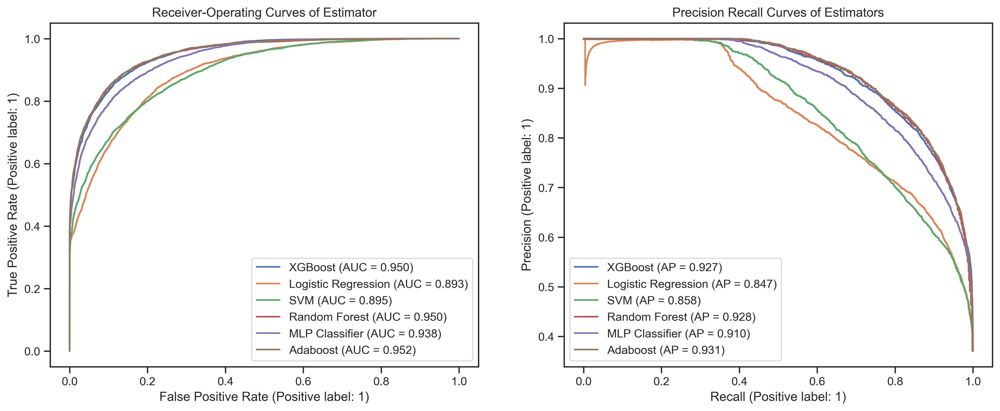

In [267]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay, average_precision_score

# ROC Curve Helper Function
def roc_plot(classifier, name, ax, X=X_train_test_ohe, y=y_train_test_ohe):
    """Helper function to plot ROC curves"""
    auc_score = classifier.score(X, y)
    RocCurveDisplay.from_estimator(
        classifier, X, y, ax = ax, 
        label = f"{name} (AUC = {auc_score:.3f})"
    )
    pass


# Precision Recall Curves Helper Function
def pr_curve_plot(classifier, name, ax, X = X_train_test_ohe, 
             y = y_train_test_ohe):
    """Helper function to plot PR Curves"""
    prediction_probs = classifier.predict_proba(X)
    ap_score = average_precision_score(y, prediction_probs[:,1])
    PrecisionRecallDisplay.from_estimator(
        classifier, X, y,ax = ax,
        label = f"{name} (AP = {ap_score:.3f})"
    )
    pass

fig, axes = plt.subplots(1,2,figsize = (16,6))
# Plot xgboost roc_auc curve
roc_plot(classifier = xgb_search, name = "XGBoost", ax = axes[0])
# Plot logistic roc_auc curve
roc_plot(logistic_ohe_search, "Logistic Regression", ax = axes[0])
# Plot svm roc_auc curve
roc_plot(svm_search, "SVM", ax = axes[0])
# Plot random forest roc_auc curve
roc_plot(random_forest_search, "Random Forest", ax = axes[0])
# Plot MLP Classifier roc_auc curve
roc_plot(mlp_search, "MLP Classifier", ax = axes[0])
# Plot Adaboost Classifier roc_auc curve
roc_plot(ada_boost_search, "Adaboost", ax = axes[0])
axes[0].set_title("Receiver-Operating Curves of Estimator")

# Plot xgboost pr curve
pr_curve_plot(classifier = xgb_search, name = "XGBoost", ax = axes[1])
# Plot logistic pr curve
pr_curve_plot(logistic_ohe_search, "Logistic Regression", ax = axes[1])
# Plot svm pr curve
pr_curve_plot(svm_search, "SVM", ax = axes[1])
# Plot random forest pr curve
pr_curve_plot(random_forest_search, "Random Forest", ax = axes[1])
# Plot MLP Classifier pr curve
pr_curve_plot(mlp_search, "MLP Classifier", ax = axes[1])
# Plot Adaboost Classifier pr curve
pr_curve_plot(ada_boost_search, "Adaboost", ax = axes[1])
axes[1].set_title("Precision Recall Curves of Estimators")
plt.show()

#### Plot training and validation times {-}

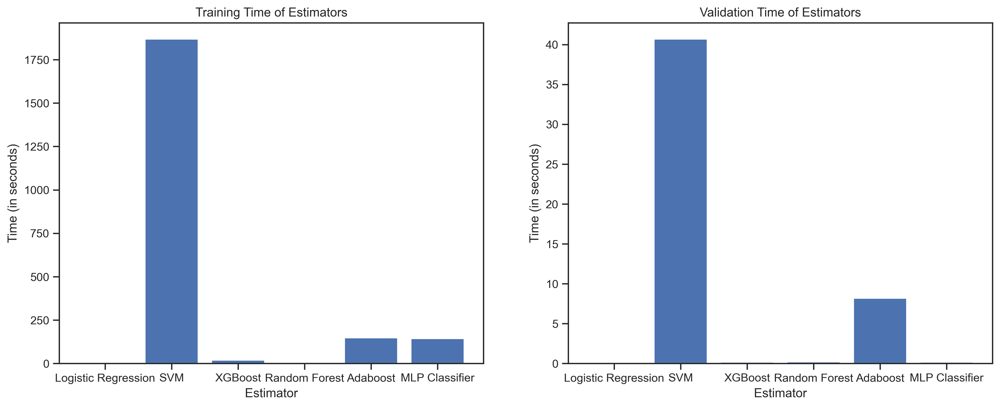

In [269]:
from time import time
# Get fit times on the whole dataset
fit_times = [
    logistic_ohe_search.refit_time_,
    svm_search.refit_time_,
    xgb_search.refit_time_,
    random_forest_search.refit_time_,
    ada_boost_search.refit_time_,
    mlp_search.refit_time_
]

# Get model names
model_names = [
    "Logistic Regression",
    "SVM",
    "XGBoost",
    "Random Forest",
    "Adaboost",
    "MLP Classifier"
]

# Get models
models = [
    logistic_ohe_search,
    svm_search,
    xgb_search,
    random_forest_search,
    ada_boost_search,
    mlp_search
]

# Get prediction times
pred_times = []
for model in models:
    start = time()
    _ = model.predict_proba(X_train_test_ohe)
    end = time()
    pred_times.append(end - start)

# Plot training and validation times
fig, axes = plt.subplots(1,2,figsize = (16,6))
axes[0].bar(x = model_names, height = fit_times)
axes[0].set_title("Training Time of Estimators")
axes[0].set_xlabel("Estimator")
axes[0].set_ylabel("Time (in seconds)")
axes[1].bar(x = model_names, height= pred_times)
axes[1].set_title("Validation Time of Estimators")
axes[1].set_xlabel("Estimator")
axes[1].set_ylabel("Time (in seconds)")
plt.show()

> In terms of AUC performance, the tree-based models of Random Forest, Adaboost and XGBoost models seem to perform about the same. The three models also outperform other models on the precision-recall curve. Submissions on Kaggle also confirms that these are some of my best-performing models. The multiple layer perceptron model performed well but not as well as the tree-based models. In comparison, SVM and Logistic Regression lags behind in performance. 
>
> To tune hyperparameters, I first did research on the range of best-performing hyperparameters and then either set up grids using lists or used the `loguniform` and `uniform` functions in scipy's stats library to setup parameter grids. I fed the grid into `RandomizedSearchCV` instances to identify the best-performing model since our dataset is so large. 
>
> Random Forest also had one of the lowest training and prediction time, followed by XGBoost. Adaboost, in contrast had higher training validation time, but is the best-performing model for me on kaggle.
>
> Therefore, we decide to submit the three tree-based models for consideration on kaggle.

#### **Putting Model into Practice** {-}

**Retraining Random Forest Model and Make Predictions**

In [241]:
from sklearn.base import clone
# Traing on full dataset
random_forest_best = clone(random_forest_search.best_estimator_)
random_forest_best.fit(X_train_ohe, y_train)
# Make predictions
random_forest_predictions = random_forest_best.predict_proba(X_test_ohe)
# Format and export to csv
random_forest_predictions = pd.DataFrame(random_forest_predictions[:, 1])
random_forest_predictions.rename(columns={0: "score"}, inplace=True)
random_forest_predictions.to_csv("submissions/random_forest_1.csv", index_label="id")

**Retraining Adaboost Model and Make Predictions**

In [51]:
# Traing on full dataset
ada_boost_best = clone(ada_boost_search.best_estimator_)
ada_boost_best.fit(X_train_ohe, y_train)
# Make predictions
adaboost_predictions = ada_boost_best.predict_proba(X_test_ohe)
# Format and export to csv
adaboost_predictions = pd.DataFrame(adaboost_predictions[:, 1])
adaboost_predictions.rename(columns={0: "score"}, inplace=True)
adaboost_predictions.to_csv("submissions/adaboost_1.csv", index_label="id")

**Retraining XGBoost Model and Make Predictions**

In [23]:
# Traing on full dataset
xgb_best = clone(xgb_search.best_estimator_)
xgb_best.fit(X_train_ohe, y_train)
# Make predictions
xgb_predictions = xgb_search.predict_proba(X_test_ohe)
# Format and export to csv
xgb_predictions = pd.DataFrame(xgb_predictions[:, 1])
xgb_predictions.rename(columns={0: "score"}, inplace=True)
xgb_predictions.to_csv("submissions/xgb_3.csv", index_label="id")


**Retraining MLP Model and Make Predictions**

In [242]:
# Traing on full dataset
mlp_best = clone(mlp_search.best_estimator_)
mlp_best.fit(X_train_ohe, y_train)
# Make predictions
mlp_predictions = mlp_best.predict_proba(X_test_ohe)
# Format and export to csv
mlp_predictions = pd.DataFrame(mlp_predictions[:, 1])
mlp_predictions.rename(columns={0: "score"}, inplace=True)
mlp_predictions.to_csv("submissions/mlp_1.csv", index_label="id")

**Retraining SVM Model and Make Predictions**

In [274]:
# Traing on full dataset
svm_best = clone(svm_search.best_estimator_)
svm_best.fit(X_train_ohe, y_train)
# Make predictions
svm_predictions = svm_best.predict_proba(X_test_ohe)
# Format and export to csv
svm_predictions = pd.DataFrame(svm_predictions[:, 1])
svm_predictions.rename(columns={0: "score"}, inplace=True)
svm_predictions.to_csv("submissions/svm_1.csv", index_label="id")

# 2 {-}

## [25 points] Clustering {-}

Clustering can be used to reveal structure between samples of data and assign group membership to similar groups of samples. This exercise will provide you with experience applying clustering algorithms and comparing these techniques on various datasets to experience the pros and cons of these approaches when the structure of the data being clustered varies. For this exercise, we'll explore clustering in two dimensions to make the results more tangible, but in practice these approaches can be applied to any number of dimensions.

*Note: For each set of plots across the five datasets, please create subplots within a single figure (for example, when applying DBSCAN - please show the clusters resulting from DBSCAN as a single figure with one subplot for each dataset). This will make comparison easier.*

**(a) Run K-means and choose the number of clusters**. Five datasets are provided for you below and the code to load them below.
- Scatterplot each dataset
- For each dataset run the k-means algorithm for values of $k$ ranging from 1 to 10 and for each plot the "elbow curve" where you plot dissimilarity in each case. Here, you can measure dissimilarity using the within-cluster sum-of-squares, which in sklean is known as "inertia" and can be accessed through the `inertia_` attribute of a fit KMeans class instance.
- For each dataset, where is the elbow in the curve of within-cluster sum-of-squares and why? Is the elbow always clearly visible? When it's not clear, you will have to use your judgment in terms of selecting a reasonable number of clusters for the data. *There are also other metrics you can use to explore to measure the quality of cluster fit (but do not have to for this assignment) including the silhouette score, the Calinski-Harabasz index, and the Davies-Bouldin, to name a few within sklearn alone. However, assessing the quality of fit without "preferred" cluster assignments to compare against (that is, in a truly unsupervised manner) is challenging because measuring cluster fit quality is typically poorly-defined and doesn't generalize across all types of inter- and intra-cluster variation.*
- Plot your clustered data (different color for each cluster assignment) for your best $k$-means fit determined from both the elbow curve and your judgment for each dataset and your inspection of the dataset.

**(b) Apply DBSCAN**. Vary the `eps` and `min_samples` parameters to get as close as you can to having the same number of clusters as your choices with K-means. In this case, the black points are points that were not assigned to clusters.

**(c) Apply Spectral Clustering**. Select the same number of clusters as selected by k-means.

**(d) Comment on the strengths and weaknesses of each approach**. In particular, mention: 
- Which technique worked "best" and "worst" (as defined by matching how human intuition would cluster the data) on each dataset?
- How much effort was required to get good clustering for each method (how much parameter tuning needed to be done)?

*Note: For these clustering plots in this question, do NOT include legends indicating cluster assignment; instead, just make sure the cluster assignments are clear from the plot (e.g. different colors for each cluster)*



Code is provided below for loading the datasets and for making plots with the clusters as distinct colors

In [56]:
################################
# Load the data
################################
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs, make_moons

# Create / load the datasets:
n_samples = 1500
X0, _ = make_blobs(n_samples=n_samples, centers=2, n_features=2, random_state=0)
X1, _ = make_blobs(n_samples=n_samples, centers=5, n_features=2, random_state=0)

random_state = 170
X, y = make_blobs(n_samples=n_samples, random_state=random_state, cluster_std=1.3)
transformation = [[0.6, -0.6], [-0.2, 0.8]]
X2 = np.dot(X, transformation)
X3, _ = make_blobs(
    n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state
)
X4, _ = make_moons(n_samples=n_samples, noise=0.12)

X = [X0, X1, X2, X3, X4]
# The datasets are X[i], where i ranges from 0 to 4


In [60]:
################################
# Code to plot clusters
################################
def plot_cluster(ax, data, cluster_assignments):
    """Plot two-dimensional data clusters

    Parameters
    ----------
    ax : matplotlib axis
        Axis to plot on
    data : list or numpy array of size [N x 2]
        Clustered data
    cluster_assignments : list or numpy array [N]
        Cluster assignments for each point in data

    """
    clusters = np.unique(cluster_assignments)
    n_clusters = len(clusters)
    for ca in clusters:
        kwargs = {}
        if ca == -1:
            # if samples are not assigned to a cluster (have a cluster assignment of -1, color them gray)
            kwargs = {"color": "gray"}
            n_clusters = n_clusters - 1
        ax.scatter(
            data[cluster_assignments == ca, 0],
            data[cluster_assignments == ca, 1],
            s=5,
            alpha=0.5,
            **kwargs,
        )
        ax.set_xlabel("feature 1")
        ax.set_ylabel("feature 2")
        ax.set_title(f"No. Clusters = {n_clusters}")
        ax.axis("equal")


**ANSWER**

### **(a) K-Means Clustering** {-}

**Plot scatterplots of datasets**

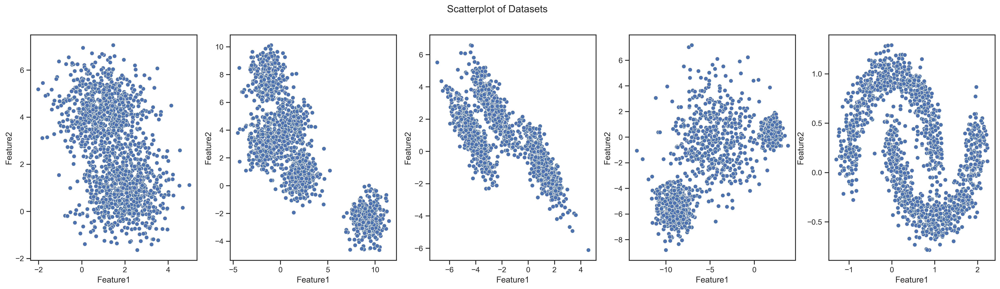

In [159]:
fig, axes = plt.subplots(1, 5, figsize=(25, 6))
# Plot x0 dataset
sns.scatterplot(x=X0[:, 0], y=X0[:, 1], ax=axes[0])
axes[0].set_xlabel("Feature1")
axes[0].set_ylabel("Feature2")

# Plot x1 dataset
sns.scatterplot(x=X1[:, 0], y=X1[:, 1], ax=axes[1])
axes[1].set_xlabel("Feature1")
axes[1].set_ylabel("Feature2")
# Plot x2 dataset
sns.scatterplot(x=X2[:, 0], y=X2[:, 1], ax=axes[2])
axes[2].set_xlabel("Feature1")
axes[2].set_ylabel("Feature2")
# Plot x3 dataset
sns.scatterplot(x=X3[:, 0], y=X3[:, 1], ax=axes[3])
axes[3].set_xlabel("Feature1")
axes[3].set_ylabel("Feature2")
# Plot x4 dataset
sns.scatterplot(x=X4[:, 0], y=X4[:, 1], ax=axes[4])
axes[4].set_xlabel("Feature1")
axes[4].set_ylabel("Feature2")
fig.suptitle("Scatterplot of Datasets")
plt.show()


**Create Elbow Plots** {-}

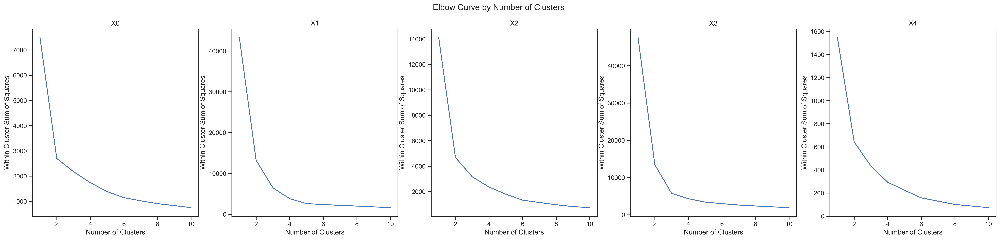

In [83]:
from sklearn.cluster import KMeans

# Initialize a matrix of inertia values
inertia = np.zeros((5, 10))

for i, dataset in enumerate(X):
    for k in range(1, 11):
        # Initialize KMeans class
        k_means = KMeans(n_clusters=k)
        # Fit datasets
        k_means.fit(dataset)
        # Store inertia value to the array
        inertia[i, k - 1] = k_means.inertia_

# Plot the elbow curves
fig, axes = plt.subplots(1, 5, figsize=(30, 6))
for i in range(5):
    sns.lineplot(x=range(1, 11), y=inertia[i, :], ax=axes[i])
    axes[i].set_title(f"X{i}")
    axes[i].set_xlabel("Number of Clusters")
    axes[i].set_ylabel("Within Cluster Sum of Squares")
fig.suptitle("Elbow Curve by Number of Clusters")
plt.show()


> Based on the elbow curves of the within-cluster sum of squares based on the number of clusters in each dataset, we can make some decisions on the most optimal number of clusters in some cases but the number is unclear for other datasets. In the X0 dataset, the optimal k is 2, for X1, the most optimal k is 4. For X2, the most optimal k is 3. For X3, the most optimal k is also 3, and for X4, there is no obvious k but 2 might be the best option.

**Plotting KMeans Clusters**

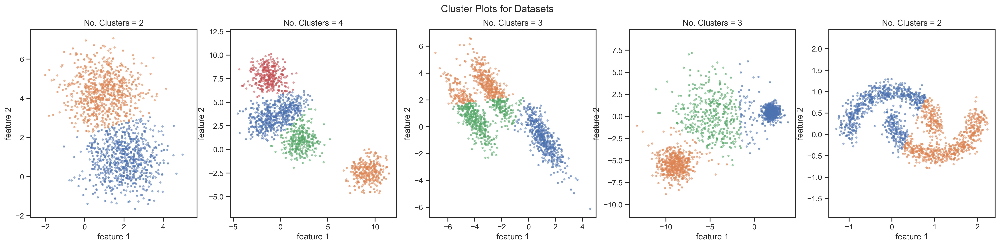

In [270]:
X0_assignments = KMeans(n_clusters=2).fit_predict(X0)
X1_assignments = KMeans(n_clusters=4).fit_predict(X1)
X2_assignments = KMeans(n_clusters=3).fit_predict(X2)
X3_assignments = KMeans(n_clusters=3).fit_predict(X3)
X4_assignments = KMeans(n_clusters=2).fit_predict(X4)

fig, axes = plt.subplots(1, 5, figsize=(25, 5))
plot_cluster(ax=axes[0], data=X0, cluster_assignments=X0_assignments)
plot_cluster(ax=axes[1], data=X1, cluster_assignments=X1_assignments)
plot_cluster(ax=axes[2], data=X2, cluster_assignments=X2_assignments)
plot_cluster(ax=axes[3], data=X3, cluster_assignments=X3_assignments)
plot_cluster(ax=axes[4], data=X4, cluster_assignments=X4_assignments)
fig.suptitle("Cluster Plots for Datasets")
plt.show()


### **(b) DBSCAN** {-}

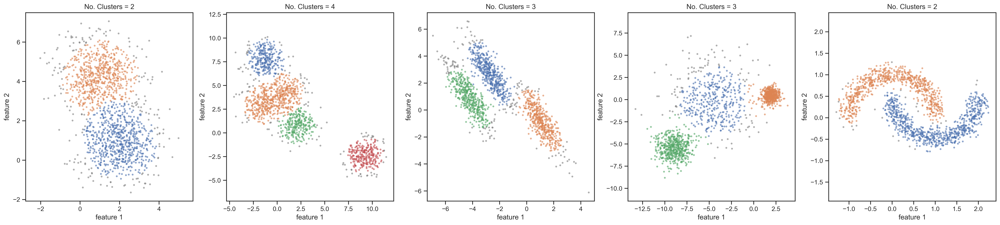

In [155]:
from sklearn.cluster import DBSCAN

# Vary the eps and min_samples
X0_dbscan_clusters = DBSCAN(eps=0.71, min_samples=90).fit_predict(X0)
X1_dbscan_clusters = DBSCAN(eps=1.1, min_samples=100).fit_predict(X1)
X2_dbscan_clusters = DBSCAN(eps=0.8, min_samples=90).fit_predict(X2)
X3_dbscan_clusters = DBSCAN(eps=1.4, min_samples=50).fit_predict(X3)
X4_dbscan_clusters = DBSCAN(eps=0.2, min_samples=50).fit_predict(X4)


fig, axes = plt.subplots(1, 5, figsize=(30, 6))
plot_cluster(ax=axes[0], data=X0, cluster_assignments=X0_dbscan_clusters)
plot_cluster(ax=axes[1], data=X1, cluster_assignments=X1_dbscan_clusters)
plot_cluster(ax=axes[2], data=X2, cluster_assignments=X2_dbscan_clusters)
plot_cluster(ax=axes[3], data=X3, cluster_assignments=X3_dbscan_clusters)
plot_cluster(ax=axes[4], data=X4, cluster_assignments=X4_dbscan_clusters)


### **(c) Spectral Clustering** {-}

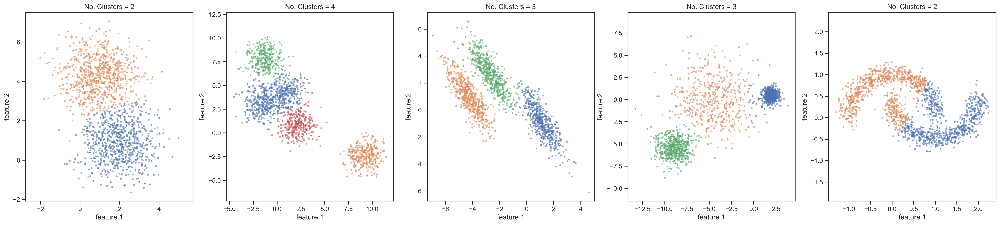

In [158]:
from sklearn.cluster import SpectralClustering

# fit and predict cluster assignments
X0_spectral_clusters = SpectralClustering(n_clusters=2).fit_predict(X0)
X1_spectral_clusters = SpectralClustering(n_clusters=4).fit_predict(X1)
X2_spectral_clusters = SpectralClustering(n_clusters=3).fit_predict(X2)
X3_spectral_clusters = SpectralClustering(n_clusters=3).fit_predict(X3)
X4_spectral_clusters = SpectralClustering(n_clusters=2).fit_predict(X4)

# Plot clusters
fig, axes = plt.subplots(1, 5, figsize=(30, 6))
plot_cluster(ax=axes[0], data=X0, cluster_assignments=X0_spectral_clusters)
plot_cluster(ax=axes[1], data=X1, cluster_assignments=X1_spectral_clusters)
plot_cluster(ax=axes[2], data=X2, cluster_assignments=X2_spectral_clusters)
plot_cluster(ax=axes[3], data=X3, cluster_assignments=X3_spectral_clusters)
plot_cluster(ax=axes[4], data=X4, cluster_assignments=X4_spectral_clusters)


#### **(d) Strengths and Weaknesses** {-}

> In terms of cluster performance, K-Means was good at clustering points that are in spherical shapes and when not one cluster is much larger than the other two. Therefore, for the third and the fifth datasets, when the clusters of points are non-spherical, K-Means worked worst. However, K-Means involves a minimal amount of hyperparameter tuning - only requiring users to tell it how many clusters the points should belong to. 
>
> DBSCAN performs well when all the clusters have similar densities and is resistent to noise and clusters of different sizes and shapes. Because DBSCAN algorithm looks for points of similar densities, points that are  mroe scattered around the cluster centers but have lower densities do not get picked up and are labeled as noise. This problem is more pronounced for Dataset 1 and Dataset 3 when the cluster density is more varied. In contrast, it prerforms better with datasets 1, 2, 4. However, DBSCAN requires the most amount of hyperparameter tuning and needs specific values of epsilon and minimum sample points for a point to be considered a core point.
>
> Spectral Clustering performs the best in terms of grouping clusters that seem most plausible by human intuition together for datasets 1, 2, 3, but runs into a similar problem as k-mearns for dataset 4, where the cluster shape is more complex. Spectral clustering also only requires the number of clusters as input.

# 3 {-}

## [25 points] Dimensionality reduction and visualization of digits with PCA and t-SNE {-}

**(a)** Reduce the dimensionality of the data with PCA for data visualization. Load the `scikit-learn` digits dataset (code provided to do this below). Apply PCA and reduce the data (with the associated cluster labels 0-9) into a 2-dimensional space. Plot the data with labels in this two dimensional space (labels can be colors, shapes, or using the actual numbers to represent the data - definitely include a legend in your plot).

**(b)** Create a plot showing the cumulative fraction of variance explained as you incorporate from $1$ through all $D$ principal components of the data (where $D$ is the dimensionality of the data). 
- What fraction of variance in the data is UNEXPLAINED by the first two principal components of the data? 
- Briefly comment on how this may impact how well-clustered the data are. 
*You can use the `explained_variance_` attribute of the PCA module in `scikit-learn` to assist with this question*

**(c)** Reduce the dimensionality of the data with t-SNE for data visualization. T-distributed stochastic neighborhood embedding (t-SNE) is a nonlinear dimensionality reduction technique that is particularly adept at embedding the data into lower 2 or 3 dimensional spaces. Apply t-SNE using the `scikit-learn` implementation to the digits dataset and plot it in 2-dimensions (with associated cluster labels 0-9). You may need to adjust the parameters to get acceptable performance. You can read more about how to use t-SNE effectively [here](https://distill.pub/2016/misread-tsne/).

**(d)** Briefy compare/contrast the performance of these two techniques. 
- Which seemed to cluster the data best and why?
- Notice that t-SNE doesn't have a `fit` method, but only a `fit_transform` method. Why is this? What implications does this imply for using this method?
*Note: Remember that you typically will not have labels available in most problems.*

Code is provided for loading the data below.

In [160]:
################################
# Load the data
################################
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# load dataset
digits = datasets.load_digits()
n_sample = digits.target.shape[0]
n_feature = digits.images.shape[1] * digits.images.shape[2]
X_digits = np.zeros((n_sample, n_feature))
for i in range(n_sample):
    X_digits[i, :] = digits.images[i, :, :].flatten()
y_digits = digits.target


**ANSWER**

### **(a) - Plot Data with Reduced Dimensionality** {-}

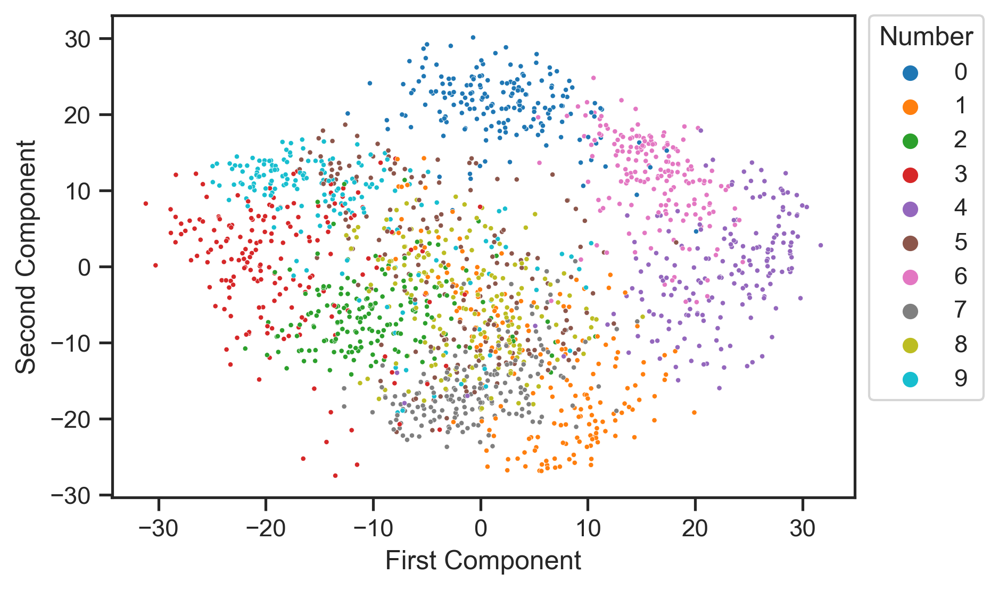

In [188]:
# Create 2d pca representation of data
pca_2d = PCA(n_components=2).fit_transform(X_digits)
ax = sns.scatterplot(
    x=pca_2d[:, 0],
    y=pca_2d[:, 1],
    hue=y_digits,
    s=5,
    palette=sns.color_palette("tab10"),
)
ax.set_xlabel("First Component")
ax.set_ylabel("Second Component")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0, title="Number")
plt.show()


### **(b) Amount of Variance Explained by D** {-}

> We retrieve the ratio of variance explained by each principal components with D components, and then apply the cumulative sum function to it. We can then plot the ratio of variance explained by the number of principal components used below.

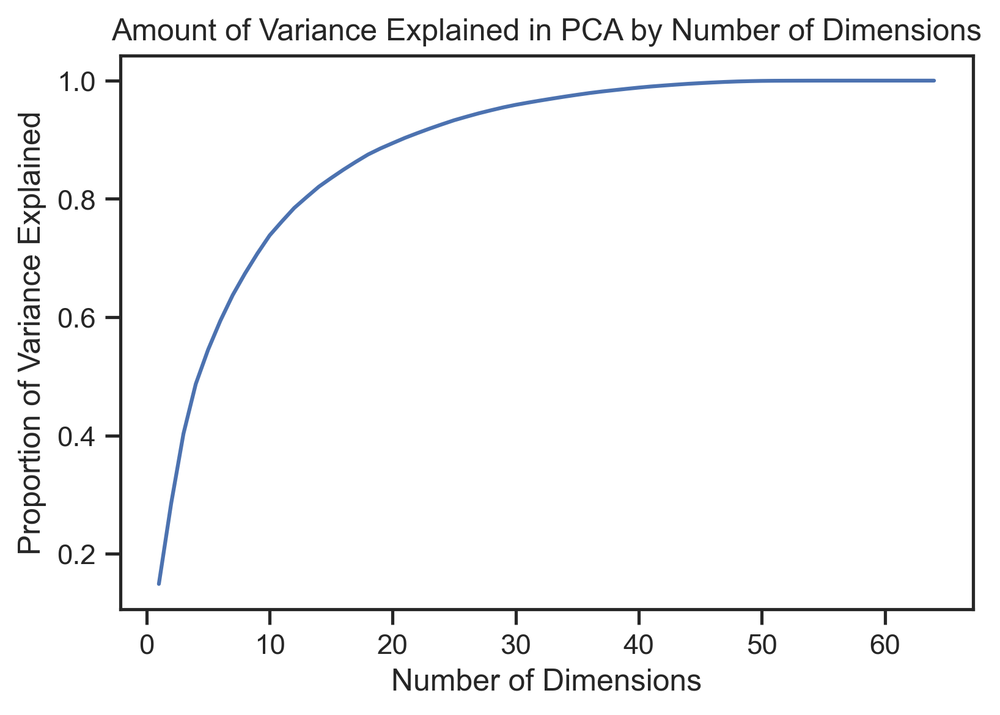

In [210]:
pca_dd = PCA(n_components=X_digits.shape[1]).fit(X_digits)
ax = sns.lineplot(x=range(1, 65), y=np.cumsum(pca_dd.explained_variance_ratio_))
ax.set_xlabel("Number of Dimensions")
ax.set_ylabel("Proportion of Variance Explained")
ax.set_title("Amount of Variance Explained in PCA by Number of Dimensions")
plt.show()


In [214]:
# Amount unexplained by first 2 PCA dimensions
variance_unexplained_2d = 1 - np.cumsum(pca_dd.explained_variance_ratio_)[1]
print(
    f"{variance_unexplained_2d * 100:.2f}% of the variance"
    " is unexplained by the first 2 dimensions of PCA."
)


71.49% of the variance is unexplained by the first 2 dimensions of PCA.


> Because a large majority of variance is not present in the first two components of the Principal Component Analysis, visualizing just these two components will not be too helpful in helping us spot the distinct differences in the clusters of points and won't result in well-separated clusters. To improve our cluster performance, we will have to include more principal components.

### **(c) T-SNE Visualization** {-}

> Below, we try out different perplexity and iteration numbers to see which combination yields the best separation between clusters of points.

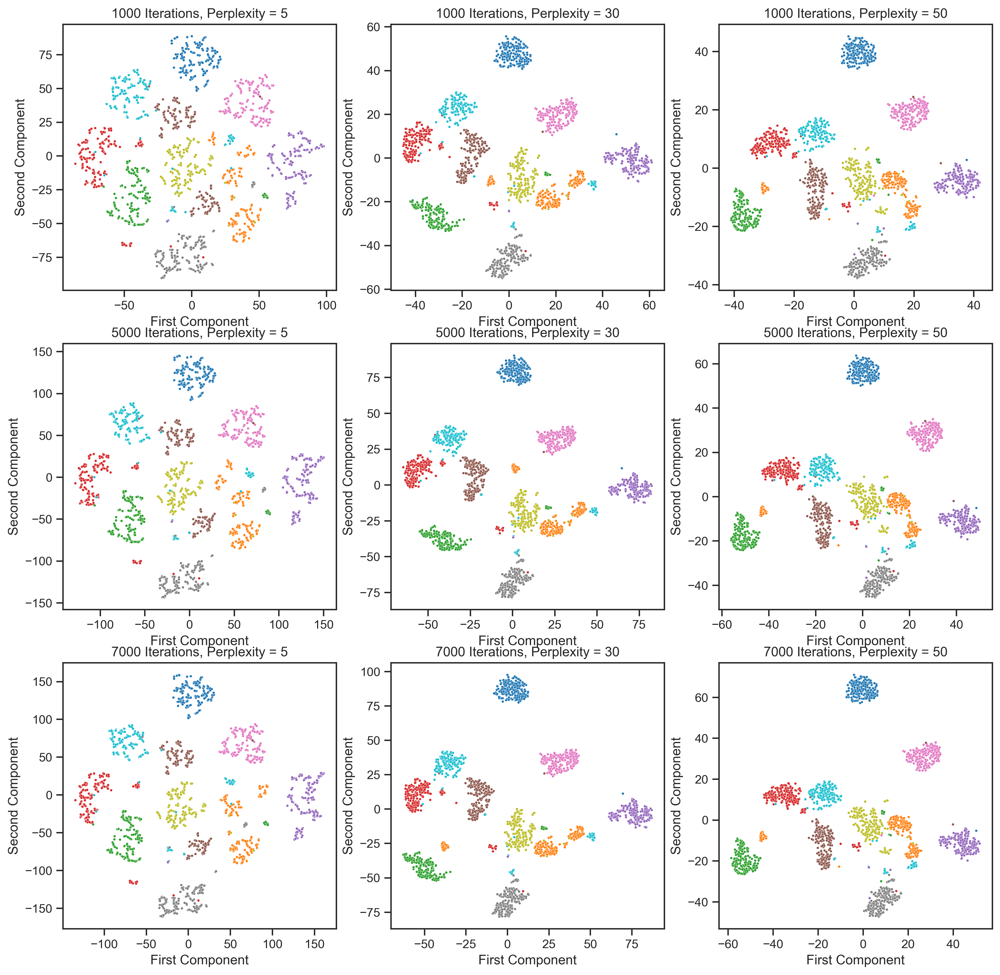

In [220]:
from sklearn.manifold import TSNE
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)

fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for row, iteration in enumerate([1000, 5000, 7000]):
    for col, perplexity in enumerate([5, 30, 50]):
        # Define the tsne components
        tsne_2d = TSNE(
            n_components=2,
            perplexity=perplexity,
            n_iter=iteration,
            learning_rate="auto",
            init="pca",
        ).fit_transform(X_digits)
        # Visualize the components
        sns.scatterplot(
            x=tsne_2d[:, 0],
            y=tsne_2d[:, 1],
            hue=y_digits,
            s=5,
            palette=sns.color_palette("tab10"),
            ax=axes[row, col],
            legend=False,
        )
        axes[row, col].set_xlabel("First Component")
        axes[row, col].set_ylabel("Second Component")
        axes[row, col].set_title(f"{iteration} Iterations, Perplexity = {perplexity}")


> We can see that the best performing T-SNE clustering is from 5000 iterations with perplexity = 30.
>
>Below, we plot this clustering instance.

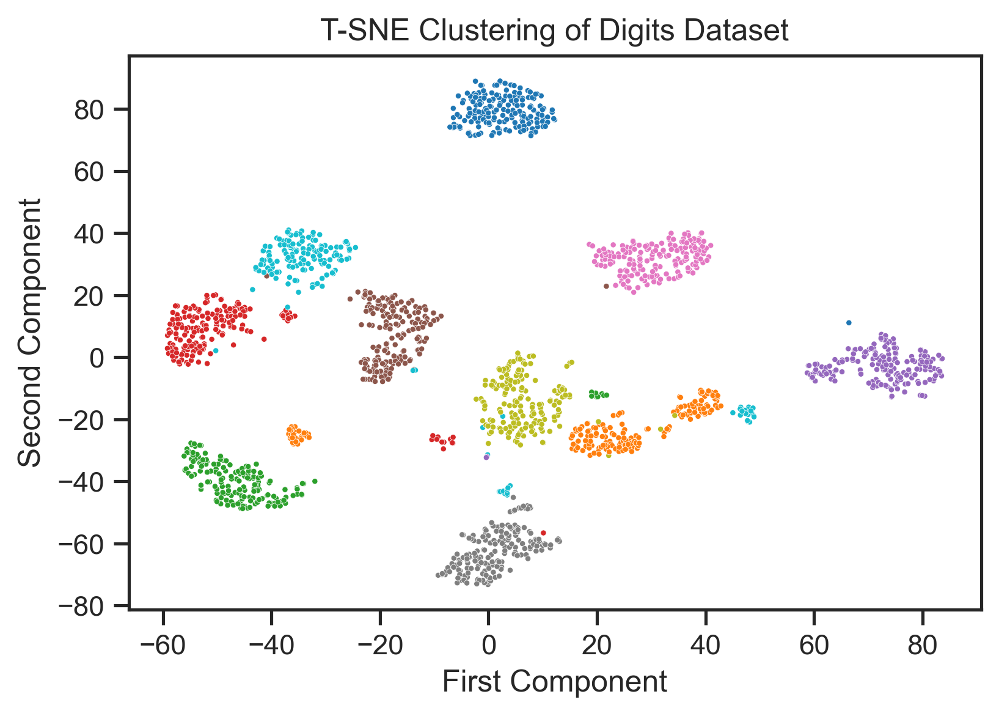

In [273]:
# Visualizing T-SNE with above parameters
tsne_2d = TSNE(
            n_components=2,
            perplexity=30,
            n_iter=5000,
            learning_rate="auto",
            init="pca",
        ).fit_transform(X_digits)

# Plot the TSNE visualization
ax = sns.scatterplot(
            x=tsne_2d[:, 0],
            y=tsne_2d[:, 1],
            hue=y_digits,
            s=5,
            palette=sns.color_palette("tab10"),
            legend=False,
        )
ax.set_xlabel("First Component")
ax.set_ylabel("Second Component")
ax.set_title("T-SNE Clustering of Digits Dataset")
plt.show()

### **(d) Compare the performance of models** {-}

> One reason that T-SNE clustering performs a lot better than PCA clustering is because it is able to transform non-linear features in the dataset better whereas PCA can only learn linear relations in the dataset. And the digits data is highly non-linear.
> 
> T-SNE does not have a transform method and only fits because it directly learns the best way to project all of the features down to 2 dimensions, and does not have an underlying transformation function that it applies to the data. Because of this, it also means that each time we apply the T-SNE algorithm, we will get different clustering results. 